<a href="https://colab.research.google.com/github/wassimarfa-git/face-detection-with-yolo/blob/main/RESNET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install tensorflow
!#pip install Keras

In [ ]:
from google.colab import files
files.upload()

Saving col2.zip to col2.zip


{'col2.zip': b'PK\x03\x04\x14\x00\x08\x08\x08\x006$WT\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x1a\x00col2/s2/sub08.jpgup\x16\x00\x01\xe4\xce\x1aGcol2/s2/sub08.jpg\x01\xa6"Y\xdd\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xdb\x00C\x00\x06\x04\x05\x06\x05\x04\x06\x06\x05\x06\x07\x07\x06\x08\n\x10\n\n\t\t\n\x14\x0e\x0f\x0c\x10\x17\x14\x18\x18\x17\x14\x16\x16\x1a\x1d%\x1f\x1a\x1b#\x1c\x16\x16 , #&\')*)\x19\x1f-0-(0%()(\xff\xdb\x00C\x01\x07\x07\x07\n\x08\n\x13\n\n\x13(\x1a\x16\x1a((((((((((((((((((((((((((((((((((((((((((((((((((\xff\xc0\x00\x11\x08\x00\xf3\x01@\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x00\x07\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x00\x08\xff\xc4\x00?\x10\x00\x01\x03\x03\x03\x02\x04\x04\x03\x06\x04\x04\x07\x00\x00\x00\x01\x00\x02\x03\x04\x05\x11\x12!1\x06A\x07\x13"a\x142Qq#\x81\x913BRr\xb1\xd1\x08\x155\xe1$6\xa1\xc1&4bc\x82\x92\xf1\xff\xc4\x00\x19\x01\x00\x03\x01\x01\x01\x00\

In [ ]:
!ls

col2.zip  sample_data


In [ ]:
!unzip *.zip

Archive:  col2.zip
  inflating: col2/s2/sub08.jpg       
  inflating: col2/s5/sub11.jpg       
  inflating: col2/s5/sub04.jpg       
  inflating: col2/s5/sub18.jpg       
  inflating: col2/s11/sub02.jpg      
  inflating: col2/s5/sub02.jpg       
  inflating: col2/s5/sub03.jpg       
  inflating: col2/s2/sub01.jpg       
  inflating: col2/s5/sub17.jpg       
  inflating: col2/s5/sub14.jpg       
  inflating: col2/s2/sub10.jpg       
  inflating: col2/s5/sub16.jpg       
  inflating: col2/s11/sub05.jpg      
  inflating: col2/s5/sub13.jpg       
  inflating: col2/s5/sub10.jpg       
  inflating: col2/s5/sub19.jpg       
  inflating: col2/s2/sub02.jpg       
  inflating: col2/s2/sub07.jpg       
  inflating: col2/s5/sub12.jpg       
  inflating: col2/s2/sub11.jpg       
  inflating: col2/s2/sub04.jpg       
  inflating: col2/s5/sub01.jpg       
  inflating: col2/s5/sub06.jpg       
  inflating: col2/s11/sub17.jpg      
  inflating: col2/s5/sub08.jpg       
  inflating: col2/s2/sub03.jpg 

In [ ]:
import os
from scipy.stats import skew, kurtosis
import copy
import warnings
warnings.filterwarnings('ignore')

import cv2
import keras
from tensorflow.keras.utils import to_categorical
from keras import backend as K
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Flatten, Input
from tensorflow.keras.layers import Conv2D, Activation, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
import matplotlib
import matplotlib.pylab as plt
import numpy as np
import seaborn as sns
'''import shap'''
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

In [ ]:
label_to_class = {
    's1':   0,
    's2':   1,
    's3':   2,
    's4':   3,
    's5':   4,
    's6':   5,
    's7':   6,
    's8':   7,
    's9':   8,
    's10':   9,
    's11':   10,
    's12':   11,


}
class_to_label = {v: k for k, v in label_to_class.items()}
n_classes = len(label_to_class)

def get_images(dir_name='./col2/', label_to_class=label_to_class):


    Images = []
    Classes = []

    for label_name in os.listdir(dir_name):
        cls = label_to_class[label_name]

        for img_name in os.listdir('/'.join([dir_name, label_name])):
            img = load_img('/'.join([dir_name, label_name, img_name]), target_size=(320, 243))
            img = img_to_array(img)

            Images.append(img)
            Classes.append(cls)

    Images = np.array(Images, dtype=np.float32)
    Classes = np.array(Classes, dtype=np.float32)
    Images, Classes = shuffle(Images, Classes, random_state=0)

    return Images, Classes

In [ ]:
## get images / labels

Images, Classes = get_images()

Images.shape, Classes.shape

((215, 320, 243, 3), (215,))

s6 19 0.08837209302325581


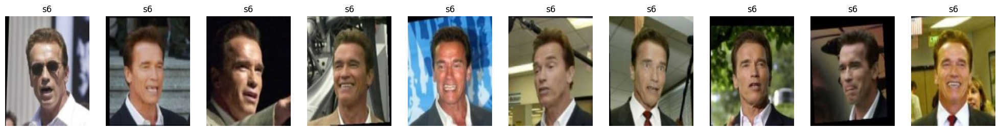

s7 19 0.08837209302325581


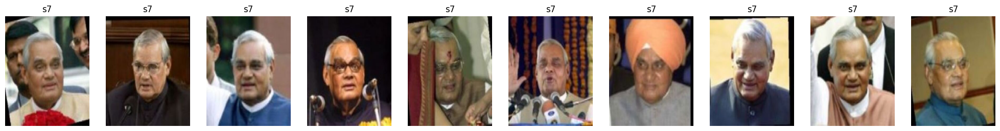

s8 19 0.08837209302325581


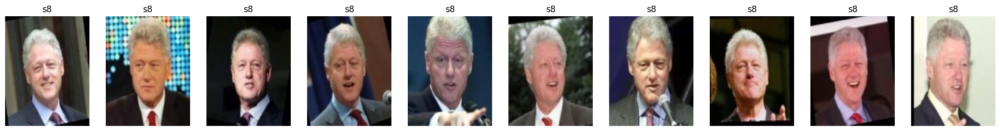

s9 17 0.07906976744186046


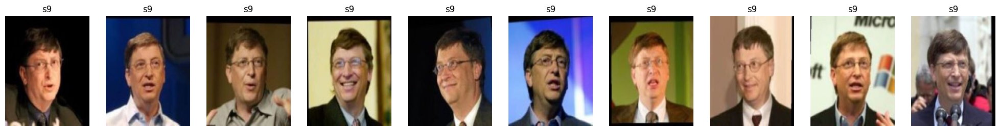

s10 19 0.08837209302325581


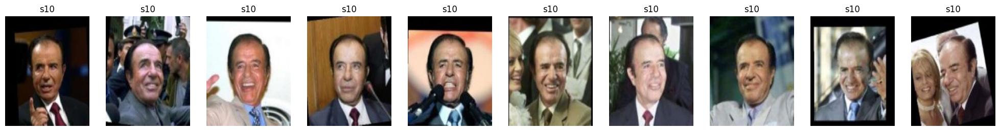

In [ ]:
## visualize some images / labels

n_total_images = Images.shape[0]

for target_cls in [5, 6, 7, 8, 9]:

    indices = np.where(Classes == target_cls)[0] # get target class indices on Images / Classes
    n_target_cls = indices.shape[0]
    label = class_to_label[target_cls]
    print(label, n_target_cls, n_target_cls/n_total_images)

    n_cols = 10 # # of sample plot
    fig, axs = plt.subplots(ncols=n_cols, figsize=(25, 3))

    for i in range(n_cols):

        axs[i].imshow(np.uint8(Images[indices[i]]))
        axs[i].axis('off')
        axs[i].set_title(label)

    plt.show()

In [ ]:
## split train / test

indices_train, indices_test = train_test_split(list(range(Images.shape[0])), train_size=0.7, test_size=0.3, shuffle=False)

x_train = Images[indices_train]
y_train = Classes[indices_train]
x_test = Images[indices_test]
y_test = Classes[indices_test]

x_train.shape, y_train.shape, x_test.shape, y_test.shape

((150, 320, 243, 3), (150,), (65, 320, 243, 3), (65,))

In [ ]:
## to one-hot

y_train = to_categorical(y_train, n_classes)
y_test = to_categorical(y_test, n_classes)

y_train.shape, y_test.shape

((150, 12), (65, 12))

In [ ]:
## to image data generator

datagen_train = ImageDataGenerator(
    preprocessing_function=preprocess_input, # image preprocessing function
    rotation_range=30,                       # randomly rotate images in the range
    zoom_range=0.1,                          # Randomly zoom image
    width_shift_range=0.1,                   # randomly shift images horizontally
    height_shift_range=0.1,                  # randomly shift images vertically
    horizontal_flip=True,                    # randomly flip images horizontally
    vertical_flip=False,                     # randomly flip images vertically
)
datagen_test = ImageDataGenerator(
    preprocessing_function=preprocess_input, # image preprocessing function
    rotation_range=30,                       # randomly rotate images in the range
    zoom_range=0.1,                          # Randomly zoom image
    width_shift_range=0.1,                   # randomly shift images horizontally
    height_shift_range=0.1,                  # randomly shift images vertically
    horizontal_flip=True,                    # randomly flip images horizontally
    vertical_flip=False,                     # randomly flip images vertically
)

In [ ]:
def build_model():
    """build model function"""

    # Resnet
    input_tensor = Input(shape=(320, 243, 3)) # To change input shape
    resnet50 = ResNet50(
        include_top=False,                # To change output shape
        weights='imagenet',               # Use pre-trained model
        input_tensor=input_tensor,        # Change input shape for this task
    )

    # fc layer
    top_model = Sequential()
    top_model.add(GlobalAveragePooling2D())               # Add GAP for cam
    top_model.add(Dense(n_classes, activation='softmax')) # Change output shape for this task

    # model
    model = Model(inputs=resnet50.input, outputs=top_model(resnet50.output))

    # frozen weights
    for layer in model.layers[:-10]:
        layer.trainable = False or isinstance(layer, BatchNormalization) # If Batch Normalization layer, it should be trainable

    # compile
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
model = build_model()

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 320, 243, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 326, 249, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 160, 122, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 160, 122, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [ ]:
## finetuning
from math import ceil

n_points = len(x_train)
n_point = len(x_test)
batch_size = 30

steps_per_epoch = ceil(n_points / batch_size)
validation_steps = ceil(n_point / batch_size)
history = model.fit_generator(
    datagen_train.flow(x_train, y_train, batch_size=30),
    epochs=5,steps_per_epoch = steps_per_epoch,validation_steps=validation_steps,#5 epochs
    validation_data=datagen_test.flow(x_test, y_test, batch_size=30),
)

Epoch 1/5
5/5 [==============================] - 35s 1s/step - loss: 2.3315 - accuracy: 0.2467 - val_loss: 2.7604 - val_accuracy: 0.2000
Epoch 2/5
5/5 [==============================] - 5s 988ms/step - loss: 0.9374 - accuracy: 0.7667 - val_loss: 3.5020 - val_accuracy: 0.2154
Epoch 3/5
5/5 [==============================] - 6s 1s/step - loss: 0.3711 - accuracy: 0.9267 - val_loss: 7.1226 - val_accuracy: 0.1538
Epoch 4/5
5/5 [==============================] - 4s 923ms/step - loss: 0.2201 - accuracy: 0.9400 - val_loss: 5.2890 - val_accuracy: 0.2615
Epoch 5/5
5/5 [==============================] - 4s 908ms/step - loss: 0.0648 - accuracy: 0.9933 - val_loss: 3.7260 - val_accuracy: 0.4154


3/3 [==============================] - 3s 258ms/step


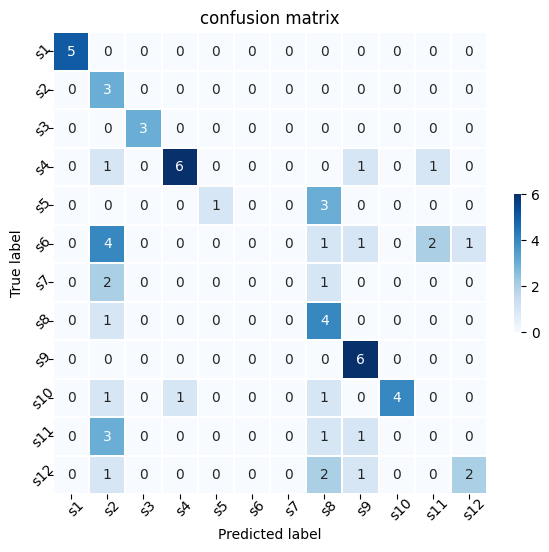

In [ ]:
## plot confusion matrix

x = preprocess_input(copy.deepcopy(x_test))
y_preds = model.predict(x)
y_preds = np.argmax(y_preds, axis=1)
y_trues = np.argmax(y_test, axis=1)
cm = confusion_matrix(y_trues, y_preds)

fig, ax = plt.subplots(figsize=(7, 6))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar_kws={'shrink': .3}, linewidths=.1, ax=ax)

ax.set(
    xticklabels=list(label_to_class.keys()),
    yticklabels=list(label_to_class.keys()),
    title='confusion matrix',
    ylabel='True label',
    xlabel='Predicted label'
)
params = dict(rotation=45, ha='center', rotation_mode='anchor')
plt.setp(ax.get_yticklabels(), **params)
plt.setp(ax.get_xticklabels(), **params)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from PIL import Image
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
y_score=model.predict(x_test)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

3/3 [==============================] - 0s 164ms/step


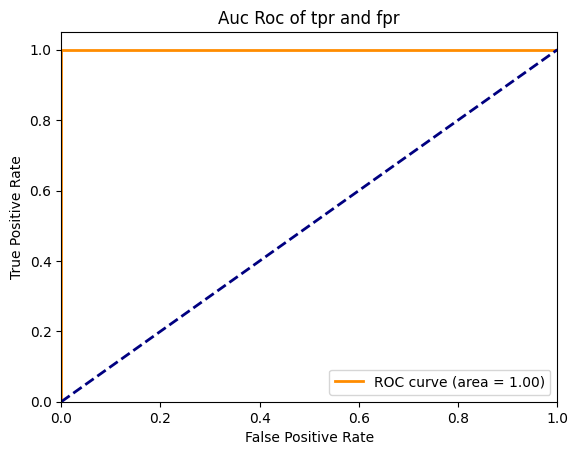

In [ ]:
plt.figure()
lw = 2
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Auc Roc of tpr and fpr')
plt.legend(loc="lower right")
plt.show()